In [1]:
import torch
import sys, os
module_rootdir = '../../..'
dataset_rootdir = '../../../..'
label_rootdir = module_rootdir
sys.path.append(module_rootdir)
import config_dataset
from modules.proposal.constants import _IGNORED_CLASS_DEFAULT_ID_
from modules.dataset_utils.bdd_dataset_utils import constants
from modules.dataset_utils.bdd_dataset_and_dataloader import BerkeleyDeepDriveDataset, extract_valid_bbox
from modules.proposal.box_association import fcos_match_locations_to_gt_main
from modules.proposal.box_functions import gen_grid_coord
from modules.plot.viz_annotation import vizualize_bbox_resized, draw_associations_single_image2
from modules.dataset_utils.bdd_dataset_utils.remapped_bdd_utils import load_ground_truths
from modules.proposal.prop_functions import (
    fcos_get_deltas_from_locations, fcos_apply_deltas_to_locations,
    get_bbox_offsets, compute_bbox_from_offsets,
    get_bbox_offsets_normalized, compute_bbox_from_offsets_normalized,
    get_bbox_deltas_normalized, compute_bbox_from_deltas_normalized )
from modules.proposal.constants import _MATCH_CRITERIA_, _SHRINK_FACTOR_

device = 'cuda'

In [2]:
num_samples = 100

gt_labels_train = load_ground_truths(
    label_rootdir,
    config_dataset.bdd_sel_train_labels_file,
    dataset_rootdir,
    config_dataset.bdd_train_images_dir)

bdd_dataset = BerkeleyDeepDriveDataset(
    gt_labels_train, 
    (constants._IMG_D_, constants._IMG_RESIZED_H_, constants._IMG_RESIZED_W_),
    subset = num_samples, shuffle_dataset = False, 
    device=device, augment = False)

Load JSON file .. please wait
annotations from 1/69863 aggregated
annotations from 2001/69863 aggregated
annotations from 4001/69863 aggregated
annotations from 6001/69863 aggregated
annotations from 8001/69863 aggregated
annotations from 10001/69863 aggregated
annotations from 12001/69863 aggregated
annotations from 14001/69863 aggregated
annotations from 16001/69863 aggregated
annotations from 18001/69863 aggregated
annotations from 20001/69863 aggregated
annotations from 22001/69863 aggregated
annotations from 24001/69863 aggregated
annotations from 26001/69863 aggregated
annotations from 28001/69863 aggregated
annotations from 30001/69863 aggregated
annotations from 32001/69863 aggregated
annotations from 34001/69863 aggregated
annotations from 36001/69863 aggregated
annotations from 38001/69863 aggregated
annotations from 40001/69863 aggregated
annotations from 42001/69863 aggregated
annotations from 44001/69863 aggregated
annotations from 46001/69863 aggregated
annotations from 4

In [3]:
feat_h, feat_w = constants._OUT_FEAT_SIZE_H_, constants._OUT_FEAT_SIZE_W_
strides_h, strides_w = constants._STRIDE_H_, constants._STRIDE_W_
grid_coord = gen_grid_coord(feat_w, feat_h, strides_w, strides_h, device)

print('strides width: ============================================>')
print(strides_w)
print('strides height: ===========================================>')
print(strides_h)
print('feature width: ============================================>')
print(feat_w)
print('feature height: ===========================================>')
print(feat_h)

strides width: ============================================>
4.0
strides height: ===========================================>
4.0
feature width: ============================================>
160
feature height: ===========================================>
90


d:\obj_det_bdd_dataset\version_combined_final\tests\bdd\proposal\../../..\modules\dataset_utils\bdd_dataset_and_dataloader.py:33: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  return gt_boxes[valid_condition], gt_class[valid_condition]


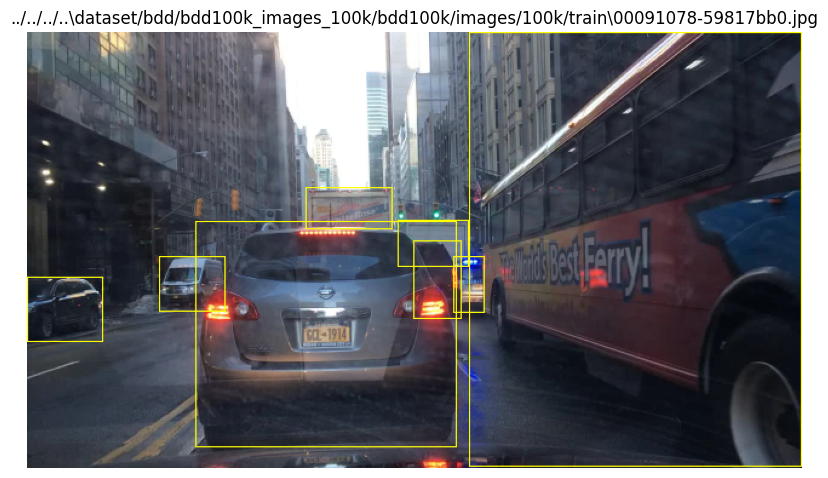

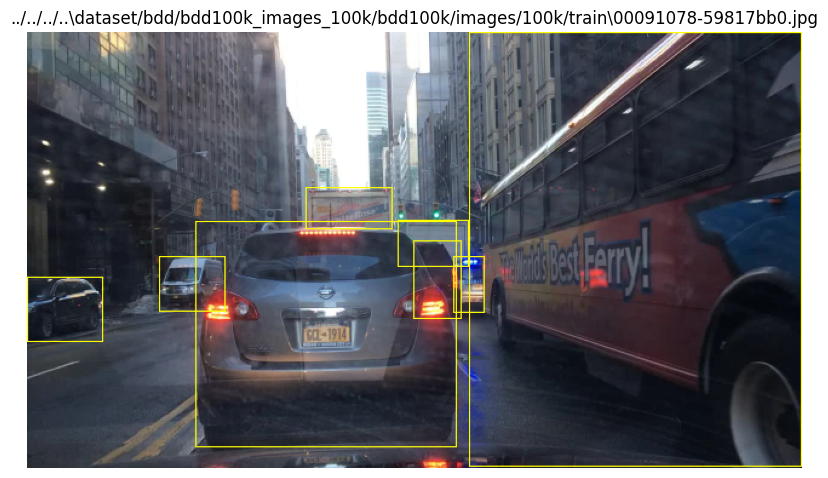

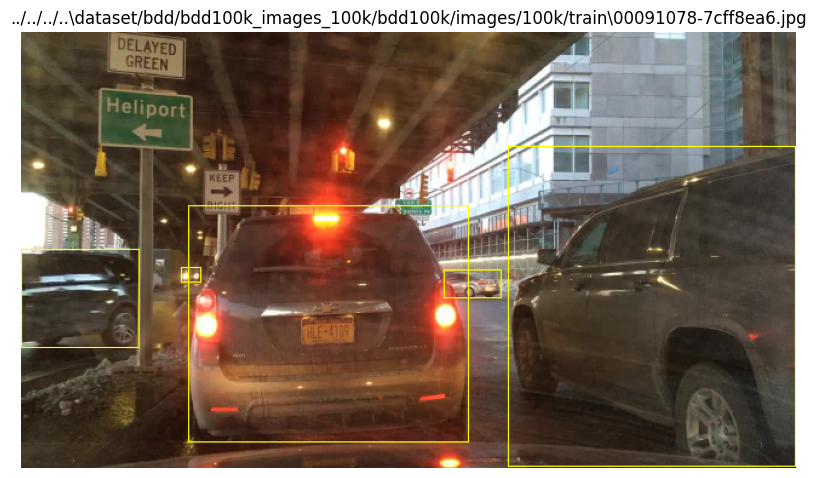

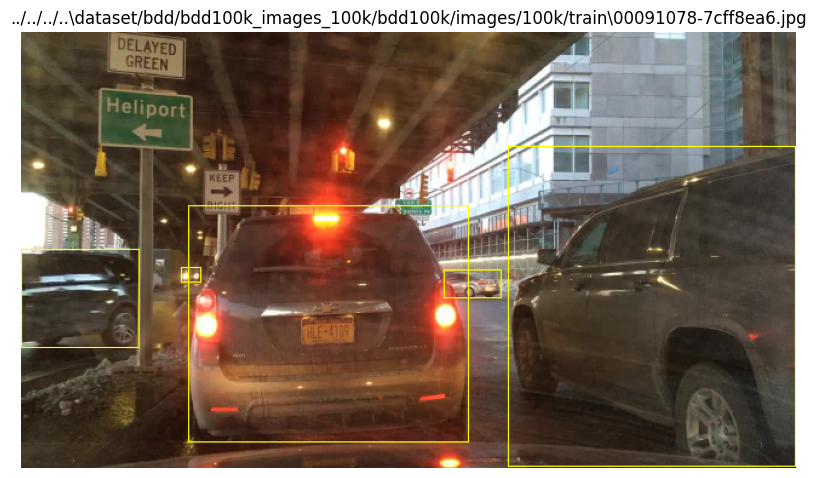

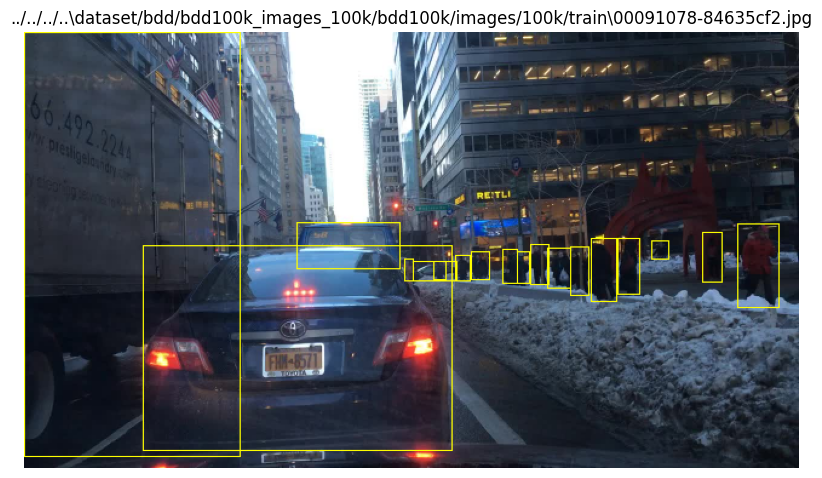

...

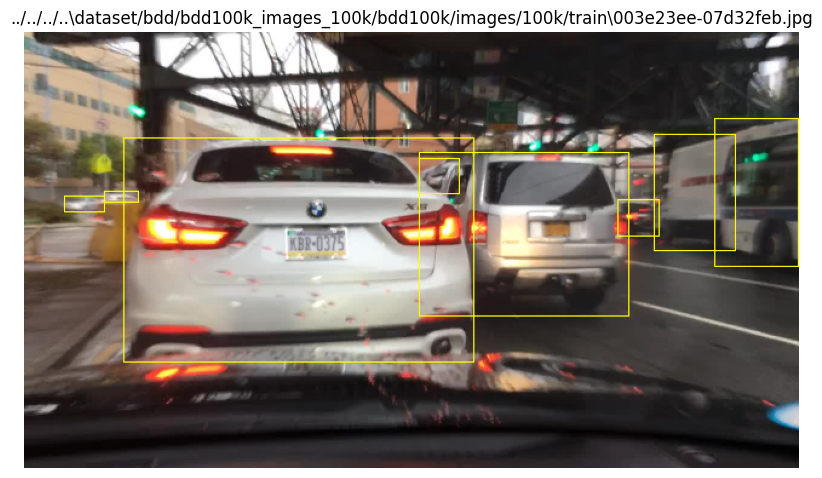

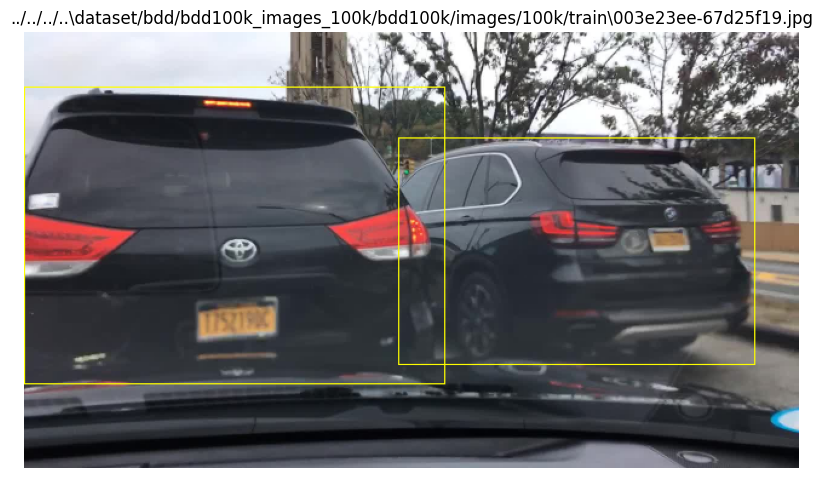

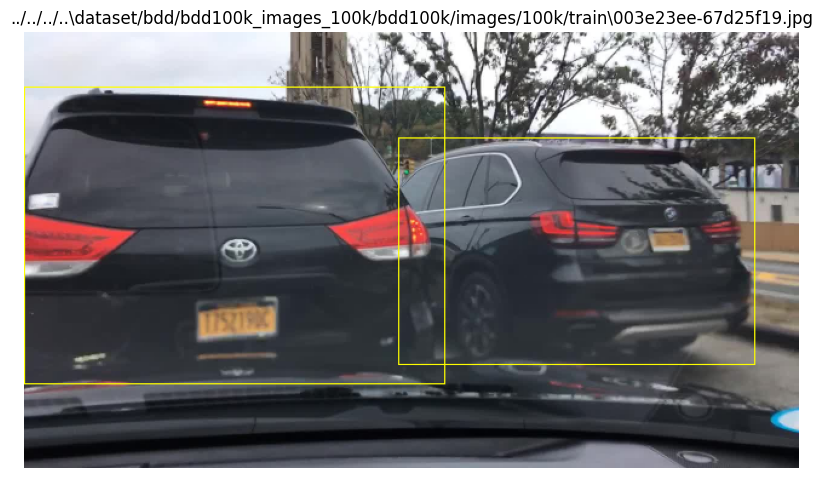

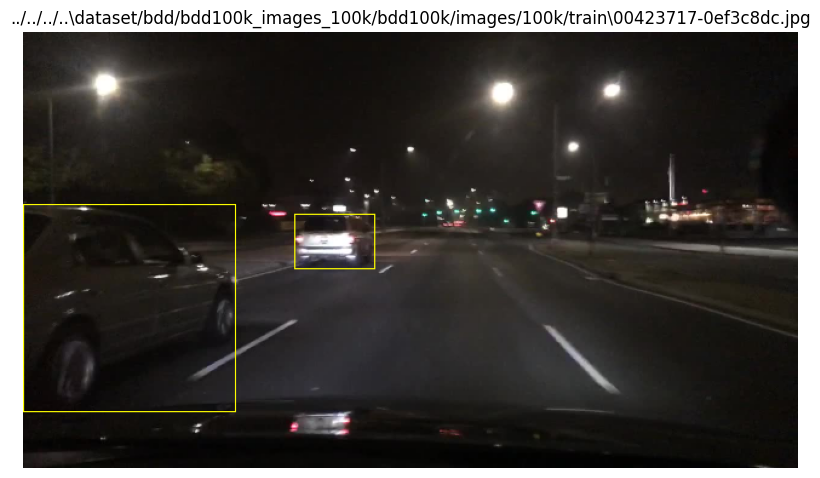

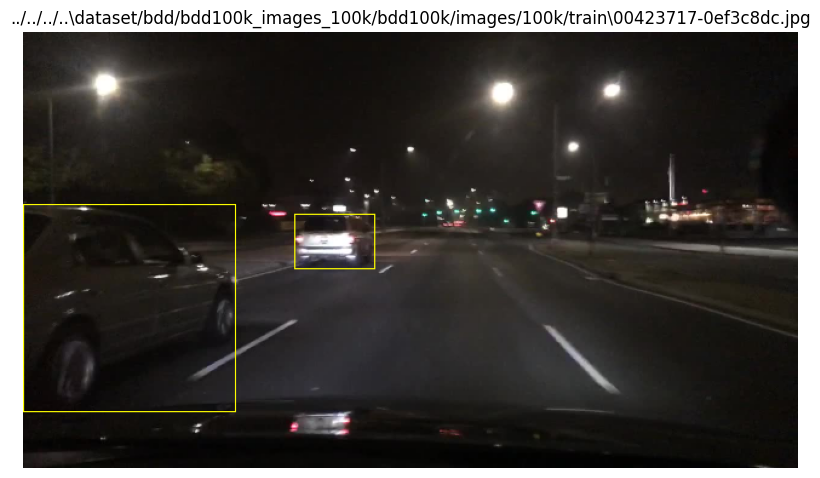

In [4]:
image_idx = [14, 15, 16, 17, 18, 19, 20, 27, 29, 37, 53, 61, 63, 64, 89, 92, 93, 99]

VALIDATE1 = False
VALIDATE2 = False
VALIDATE3 = False
VALIDATE4 = True

for i in range(len(image_idx)):
    image, labels = bdd_dataset.__getitem__(image_idx[i])
    img_path = labels['img_path']

    bbox, cls_label = extract_valid_bbox(labels['bbox'], labels['obj_class_label'])
    bbox = bbox.to(device)
    cls_label = cls_label.to(device)

    matched_gt_class, \
    matched_gt_boxes = fcos_match_locations_to_gt_main(
        grid_coord, bbox, cls_label, device, 
        _IGNORED_CLASS_DEFAULT_ID_, _SHRINK_FACTOR_, _MATCH_CRITERIA_)   # 'closest_box' or 'smallest_area'

    # compute box transforms and back
    if VALIDATE1:
        transforms = fcos_get_deltas_from_locations(grid_coord, matched_gt_boxes, strides_w, strides_h)
        bbox_from_transforms = fcos_apply_deltas_to_locations(grid_coord, transforms, strides_w, strides_h)

    elif VALIDATE2:
        transforms = get_bbox_offsets(grid_coord, matched_gt_boxes, strides_w, strides_h)
        bbox_from_transforms = compute_bbox_from_offsets(grid_coord, transforms, strides_w, strides_h)

    elif VALIDATE3:
        offsets_mean = torch.tensor([0, 0, 3.4, 3.2], dtype=torch.float32, device=device)
        offsets_std = torch.tensor([6, 5, 0.7, 0.7], dtype=torch.float32, device=device)
        transforms = get_bbox_offsets_normalized(grid_coord, matched_gt_boxes, strides_w, strides_h, offsets_mean, offsets_std)
        bbox_from_transforms = compute_bbox_from_offsets_normalized(grid_coord, transforms, strides_w, strides_h, offsets_mean, offsets_std)
    
    elif VALIDATE4:
        offsets_mean = torch.tensor([3.9, 3.7, 3.9, 3.7], dtype=torch.float32, device=device)
        offsets_std = torch.tensor([0.9, 0.9, 0.9, 0.9], dtype=torch.float32, device=device)
        transforms = get_bbox_deltas_normalized(grid_coord, matched_gt_boxes, offsets_mean, offsets_std)
        bbox_from_transforms = compute_bbox_from_deltas_normalized(grid_coord, transforms, offsets_mean, offsets_std)

    positive_mask = matched_gt_class >= 0
    bbox_from_transforms = bbox_from_transforms[positive_mask]

    print('=' * 150)
    vizualize_bbox_resized(img_path, bbox.cpu().numpy(), constants._IMG_RESIZED_W_, constants._IMG_RESIZED_H_, figsize=(10,8))
    vizualize_bbox_resized(img_path, bbox_from_transforms.cpu().numpy(), constants._IMG_RESIZED_W_, constants._IMG_RESIZED_H_, figsize=(10,8))
    